In [3]:
import numpy as np
import math
import random
from matplotlib import pyplot as plt
from numpy.linalg import norm

# prepocessing data

In [4]:
# load data
cell_num = 884
m = 3
trial_num = 77
positions = np.load('./Behaviour.npy', allow_pickle=True)
speed = np.load('./Speed.npy', allow_pickle=True)
dff_traces = np.load('./DFF_traces.npy', allow_pickle=True)
contexts = np.load('./Map_index.npy', allow_pickle=True)
pointer = np.load('./sync.npy', allow_pickle=True)

In [5]:
cell_num = 884
m = 3
trial_num = 77
map1_dff = np.load('./mapdata/Map1.npy', allow_pickle=True)
map1_pl = np.load('./mapdata/m1_pc.npy', allow_pickle=True)
map2_dff = np.load('./mapdata/Map2.npy', allow_pickle=True)
map2_pl = np.load('./mapdata/m2_pc.npy', allow_pickle=True)
map3_dff = np.load('./mapdata/Map3.npy', allow_pickle=True)
map3_pl = np.load('./mapdata/m3_pc.npy', allow_pickle=True)
map4_dff = np.load('./mapdata/Map4.npy', allow_pickle=True)
map4_pl = np.load('./mapdata/m4_pc.npy', allow_pickle=True)

In [4]:
con_nums = np.zeros(4)
for i in range(4):
    con_nums = len(contexts[i])

In [5]:
context = np.zeros(trial_num)
for i in range(4):
    context[contexts[i]] = i

In [6]:
# determine range of input factors
for i in range(trial_num):
    if i == 0:
        pos_start = np.min(positions[i])
        pos_end = np.max(positions[i])
        speed_min = np.min(speed[i])
        speed_max = np.max(speed[i])
    else:
        if np.min(positions[i]) < pos_start:
            pos_start = np.min(positions[i])
        if np.max(positions[i]) > pos_end:
            pos_end = np.max(positions[i])
        if np.min(speed[i]) < speed_min:
            speed_min = np.min(speed[i])
        if np.max(speed[i]) > speed_max:
            speed_max = np.max(speed[i])
[pos_start, pos_end], [speed_min, speed_max]

([400.0, 2000.0], [-0.11206820221684037, 128.51277310937513])

# Identify place field sequence

## identify place cells for each context

In [6]:
pos_bins = 1
bins_n = int((2000 - 400)/pos_bins)
dff_pos = np.zeros((4, cell_num, bins_n))
shuffle_time = 1000

In [ ]:
%%time
pos_bins = 1
bins_n = int((2000 - 400)/pos_bins)
dff_pos = np.zeros((4, cell_num, bins_n))
shuffle_time = 1000
place_cells = [[] for i in range(4)]
for con in range(4):
    trial_list = contexts[con]
    for cell_id in range(cell_num):
        dFFs_pl = np.zeros((trial_num, bins_n))
        for trial in trial_list:
            p = pointer[trial]
            bins_num = np.zeros(bins_n)
            for k in range(positions[trial].shape[0]):
                if speed[trial][k] >= 2:
                    if int((positions[trial][k]-400)/pos_bins) == bins_n:
                        dFFs_pl[trial, -1] += dff_traces[cell_id, p+k]
                        bins_num[-1] += 1
                    elif int((positions[trial][k]-400)/pos_bins) == 0:
                        dFFs_pl[trial, 0] += dff_traces[cell_id, p+k]
                        bins_num[0] += 1
                    else:
                        dFFs_pl[trial, int((positions[trial][k]-400)/pos_bins)] += dff_traces[cell_id, p+k]
                        bins_num[int((positions[trial][k]-400)/pos_bins)] += 1
                bins_num[bins_num==0] = 1
                dff_pos[con, cell_id, :] = np.average(dFFs_pl[trial, :] / bins_num, axis=0)

        # shuffled PSTH
        dFFs_pos_shuffle = np.zeros((shuffle_time, bins_n))
        for i in range(1000):
            shuffled_dff = dff_traces[cell_id, :].view()
            dFFs_pl_shuffle = np.zeros((trial_num, bins_n))
            for trial in trial_list:
                p = pointer[trial]
                bins_num = np.zeros(bins_n)
                np.random.shuffle(shuffled_dff[p:p+pointer[trial+1]])
                for k in range(positions[trial].shape[0]):
                    if speed[trial][k] >= 2:
                        if int((positions[trial][k]-400)/pos_bins) == bins_n:
                            dFFs_pl_shuffle[trial, -1] += shuffled_dff[p+k]
                            bins_num[-1] += 1
                        elif int((positions[trial][k]-400)/pos_bins) == 0:
                            dFFs_pl_shuffle[trial, 0] += shuffled_dff[p+k]
                            bins_num[0] += 1
                        else:
                            dFFs_pl_shuffle[trial, int((positions[trial][k]-400)/pos_bins)] += shuffled_dff[p+k]
                            bins_num[int((positions[trial][k]-400)/pos_bins)] += 1
                    bins_num[bins_num==0] = 1
                    dFFs_pos_shuffle[i, :] = np.average(dFFs_pl_shuffle / bins_num, axis=0)
        check = 0
        for pos in range(bins_n):
            rank = np.where(dFFs_pos_shuffle[:, pos] > dff_pos[con, cell_id, pos])[0].shape[0] / shuffle_time
            if rank < 0.05:
                check += 1
            elif check > 0:
                check = 0
            if check >= 5:
                place_cells[con].append(cell_id)
                break

In [6]:
%%time
def smooth(dff_traces): # dff_traces: [trial_num, cell_num, positions]
    trials = dff_traces.shape[0]
    s_bins = 15
    s_gaussian_kernel = np.exp(-(np.arange(s_bins)-(s_bins-1)/2)**2/2)
    s_gaussian_kernel = s_gaussian_kernel / np.sum(s_gaussian_kernel*np.arange(s_bins))
    smooth_outputs = np.zeros(dff_traces.shape)
    for j in range(trials):
        for i in range(s_bins-1):
            smooth_outputs[j, :, i] = (dff_traces[j, :, :i+1] @ s_gaussian_kernel[s_bins-i-1:].reshape(1+i, 1)).reshape(cell_num)
        for i in range(s_bins-1, dff_traces.shape[2]):
            smooth_outputs[j, :, i] = (dff_traces[j, :, i-s_bins+1:i+1] @ s_gaussian_kernel.reshape(s_bins, 1)).reshape(cell_num)
    return smooth_outputs

smooth_map1 = smooth(map1_dff)
smooth_map2 = smooth(map2_dff)
smooth_map3 = smooth(map3_dff)
smooth_map4 = smooth(map4_dff)

Wall time: 209 ms


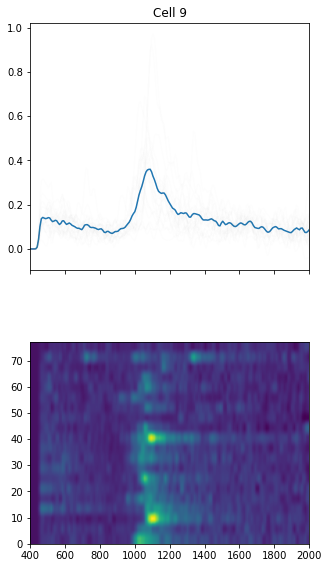

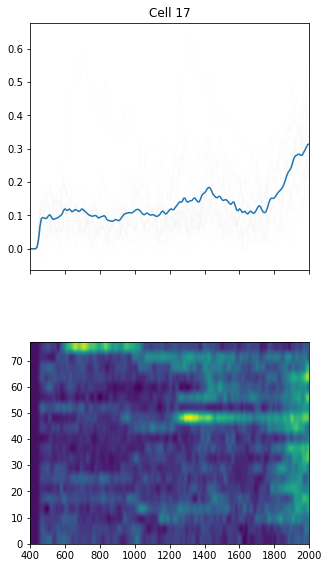

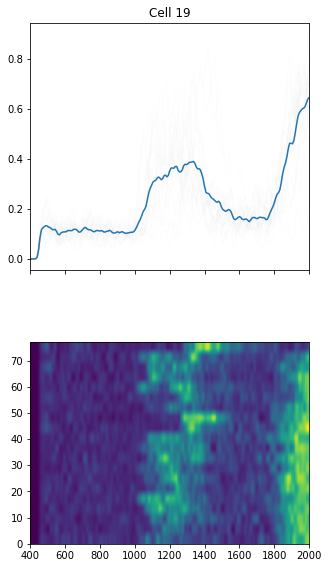

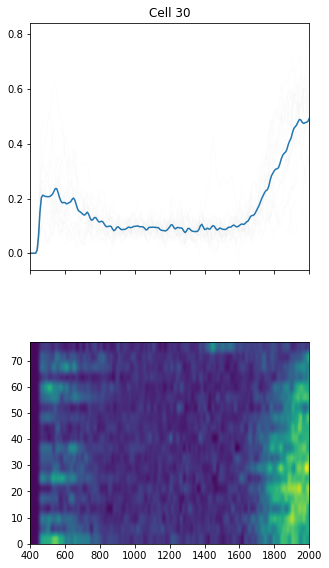

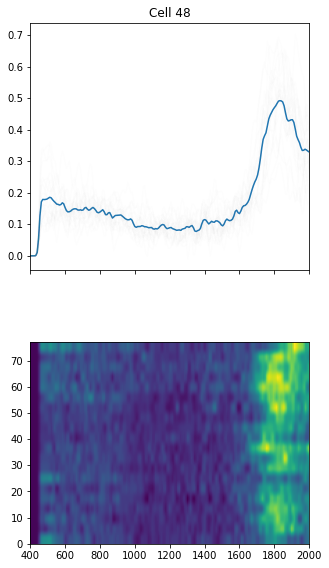

...

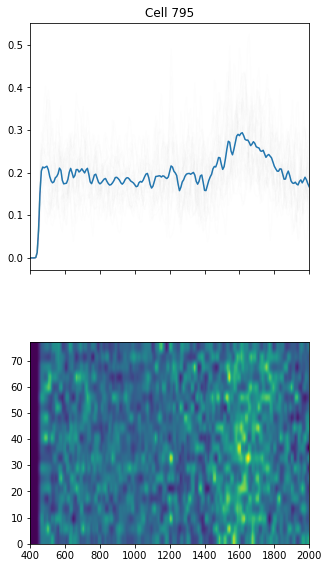

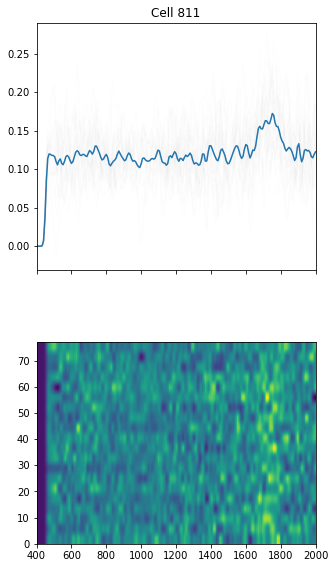

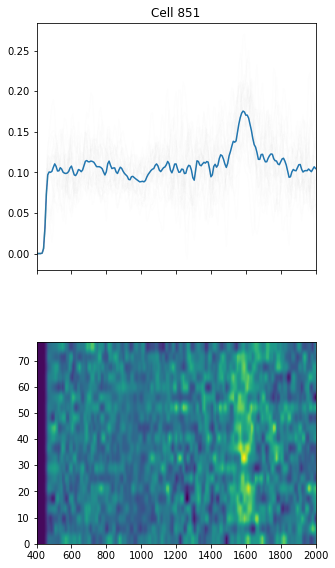

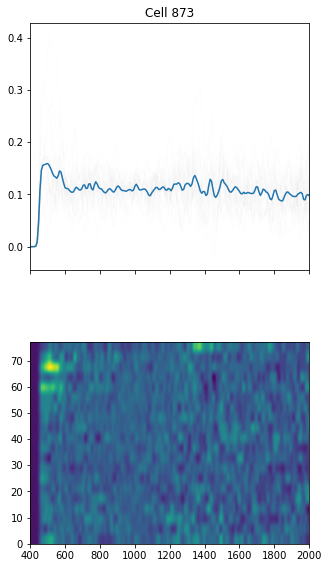

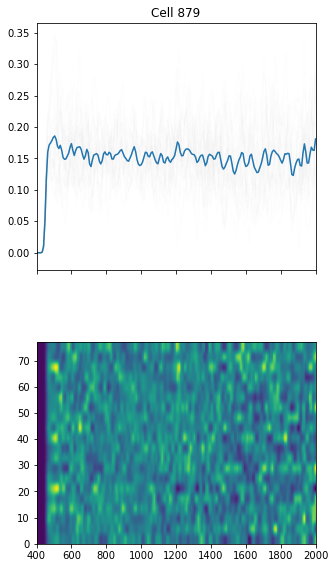

In [9]:
for cell_id in map1_pl:
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(5, 10))
    ax1.plot(np.linspace(400, 2000, 201), np.average(smooth_map1[:, cell_id, :], axis=0))
    for trial in range(smooth_map1.shape[0]):
        ax1.plot(np.linspace(400, 2000, 201), smooth_map1[trial, cell_id, :], color='grey', alpha=0.01)
    ax1.set_title('Cell '+str(cell_id))
    ax2.imshow(smooth_map1[:, cell_id, :], extent=[400, 2000, 0, 77], aspect=15)
    plt.show()

In [10]:
%%time
pos_bins = 1
bins_n = int((2000 - 400)/pos_bins)
dff_pos = np.zeros((4, cell_num, bins_n))
for con in range(4):
    trial_list = contexts[con]
    for cell_id in range(cell_num):
        dFFs_pl = np.zeros((len(trial_list), bins_n))
        for i in range(len(trial_list)):
            trial = trial_list[i]
            p = pointer[trial]
            bins_num = np.zeros(bins_n)
            for k in range(positions[trial].shape[0]):
                if speed[trial][k] >= 2.:
                    if int((positions[trial][k]-400)/pos_bins) == bins_n:
                        dFFs_pl[i, -1] += smooth_outputs[cell_id, p+k]
                        bins_num[-1] += 1
                    elif int((positions[trial][k]-400)/pos_bins) == 0:
                        dFFs_pl[i, 0] += smooth_outputs[cell_id, p+k]
                        bins_num[0] += 1
                    else:
                        dFFs_pl[i, int((positions[trial][k]-400)/pos_bins)] += smooth_outputs[cell_id, p+k]
                        bins_num[int((positions[trial][k]-400)/pos_bins)] += 1
            bins_num[bins_num==0] = 1
            dFFs_pl[i, :] /= bins_num
            dFFs_pl[i, :] /= np.linalg.norm(dFFs_pl[i, :])
        
        dff_pos[con, cell_id, :] = np.average(dFFs_pl, axis=0)
        
        fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(5, 10))
        ax1.plot(np.arange(400, 2000, pos_bins), np.average(dFFs_pl, axis=0))
        for trial in range(len(trial_list)):
            ax1.plot(np.arange(400, 2000, pos_bins), dFFs_pl[trial], color='grey', alpha=0.01)
        ax1.set_title('Cell '+str(cell_id))
        ax2.imshow(dFFs_pl, extent=[400, 2000, 0, 77], aspect=15)
        plt.show()


NameError: name 'smooth_outputs' is not defined

## activity heat map sorted by peak activity

In [10]:
for con in range(4):
    for cell_id in range(cell_num):
        dff_pos[con, cell_id, :] /= np.max(dff_pos[con, cell_id, :])

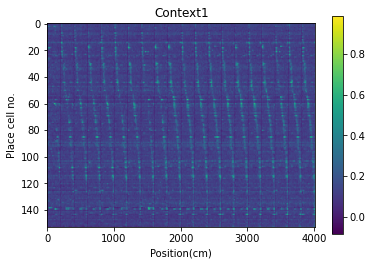

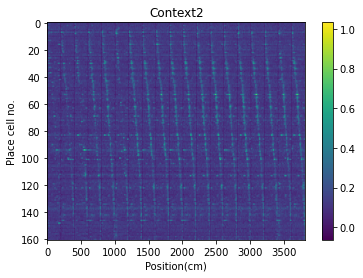

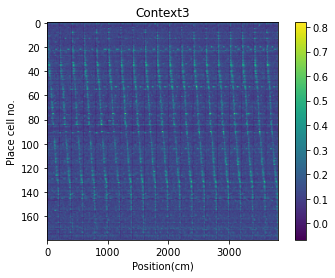

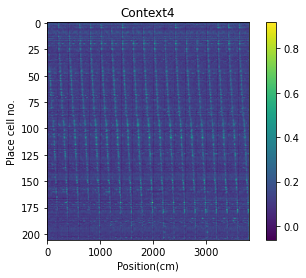

In [7]:
def get_sorted_heatmap(con, dff_pos, place_cell, bins_n=201):
    pl_activity = np.zeros((dff_pos.shape[0], len(place_cell), bins_n))
    pl_peak = np.zeros(len(place_cell))
    for i in range(len(place_cell)):
        pl_peak[i] = np.argmax(np.mean(dff_pos[:, place_cell[i], :], axis=0))
    pl_rank = np.argsort(pl_peak)
    pl_ranked = np.zeros(len(place_cell), dtype=np.int32)
    for i in range(len(place_cell)):
        pl_ranked[i] = int(place_cell[pl_rank[i]])
        pl_activity[:, i, :] = dff_pos[:, pl_ranked[i], :]
    pl_activity_show = np.zeros((len(place_cell), dff_pos.shape[0]*bins_n))
    for i in range(dff_pos.shape[0]):
        pl_activity_show[:, i*bins_n:(i+1)*bins_n] = pl_activity[i, :, :]
    plt.imshow(pl_activity_show, aspect=20)
    plt.colorbar()
    plt.title('Context'+str(con))
    plt.xlabel('Position(cm)')
    plt.ylabel('Place cell no.')
    plt.show()
    pl_peak = np.sort(pl_peak)
    return pl_ranked, pl_peak, pl_activity

pl_ranked1, pl_peak1, pl_activity1 = get_sorted_heatmap(1, smooth_map1, map1_pl)
pl_ranked2, pl_peak2, pl_activity2 = get_sorted_heatmap(2, smooth_map2, map2_pl)
pl_ranked3, pl_peak3, pl_activity3 = get_sorted_heatmap(3, smooth_map3, map3_pl)
pl_ranked4, pl_peak4, pl_activity4 = get_sorted_heatmap(4, smooth_map4, map4_pl)

## correlation matrix

In [33]:
def correlation_matrix(con, pl_activity):
    corrmatrix = np.corrcoef(pl_activity)
    plt.imshow(corrmatrix)
    plt.colorbar()
    plt.xlabel('Place cell no.')
    plt.ylabel('Place cell no.')
    plt.title('Context'+str(con))
    plt.show()

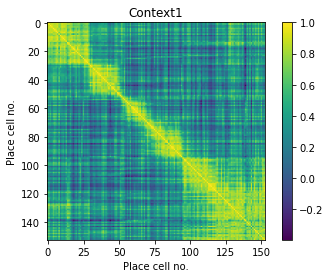

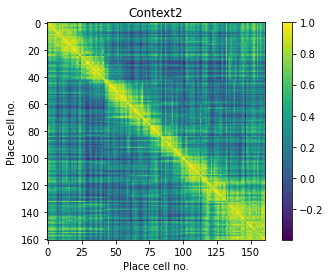

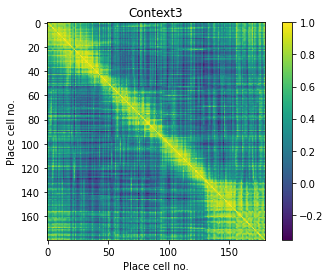

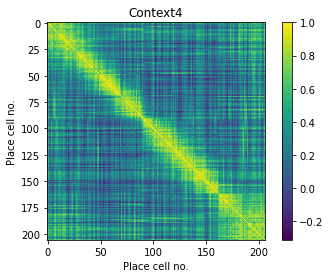

In [83]:
correlation_matrix(1, np.mean(pl_activity1, axis=0))
correlation_matrix(2, np.mean(pl_activity2, axis=0))
correlation_matrix(3, np.mean(pl_activity3, axis=0))
correlation_matrix(4, np.mean(pl_activity4, axis=0))

## identify clusters

### k-means clustering
ref: http://ixora.io/itp/learning_machines/clustering-and-numpy/

In [ ]:
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

In [10]:
def kmeans(data, k=5, limit=500):  # data: cells * positions value=dff
    # pick the first k cells to be the centers
    centers = data[:k, :]
    
    for i in range(limit):
        classifications = np.argmin(((data[:, :, None] - 
                                      centers.T[None, :, :])**2).sum(axis=1),
                                    axis=1)
        
        new_centers = np.array([data[classifications == j, :].mean(axis=0) 
                                for j in range(k)])
        if (new_centers == centers).all():
            break
        else:
            centers = new_centers
    
    return classifications, centers


In [1]:
def classify(k, pl_activity, plot=True):  # pl_activity:[pl_id, activity over positions]
    classifications, centers = kmeans(data=pl_activity, k=k)  # classifications: the cluster id of each cell
    centers_peak = np.zeros(k)
    for i in range(k):
        centers_peak[i] = np.argmax(centers[i, 1:-1])
    centers_rank = np.argsort(centers_peak)
#     print(centers_rank)
    if plot:
        for m in range(k):
            plt.plot(k-m+centers[centers_rank[m], 1:-1])
            plt.fill_between(x=np.arange(1, 200, 1), y1=k-m, y2=k-m+centers[centers_rank[m], 1:-1])
        plt.xlabel('Position(cm)')
        plt.ylabel('Average Cluster')
        plt.show()
    return classifications, centers
    

In [2]:
def silhouette_value_point(point, data, classifications): # point: the id of the point data:[point, data of the point]  classifications:[cluster id of each point]
    cluster_num = np.max(classifications) + 1
    clusters = [[] for i in range(cluster_num)]
    for i in range(cluster_num):
        clusters[i]= np.where(classifications==i)[0]
    coh = 0
    for p in clusters[classifications[point]]:
        coh += norm(data[p]-data[point])
    coh /= len(clusters[classifications[point]])
    seps = []
    for k in range(cluster_num):
        if k != classifications[point]:
            sep = 0
            for p in clusters[k]:
                sep += norm(data[p]-data[point])
            sep /= len(clusters[k])
            seps.append(sep)
    sep = np.min(np.array(seps))
    s = (sep-coh) / max(sep, coh)
    return s

def silhouette_score(data, classifications):
    s = []
    for p in range(data.shape[0]):
        s.append(silhouette_value_point(p, data, classifications))
    s = np.array(s)
    s_mean = np.mean(s)
    s = np.sort(s)
    s_25 = s[int(len(s)*0.25)]
    s_50 = s[int(len(s)*0.5)]  # median
    s_75 = s[int(len(s)*0.75)]
    return s_mean, s_25, s_50, s_75

def find_best_k(data):
    # adding one additional cluster improve the median silhouette value the most was taken as the estimate of k
    medians = np.zeros(data.shape[0])
    for k in range(2, data.shape[0]):
        classification = classify(k, data, plot=False)[0]
        medians[k] = silhouette_score(data, classification)[2]
    delta_medians = medians[1:]-medians[:-1]
    k = np.argmax(delta_medians)+2
    return k

[2 1 0]


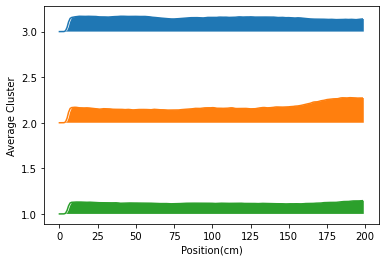

(0.18010307581661358,
 -0.053824450295005516,
 0.1858146565310037,
 0.4336778988941681)

In [30]:
k = find_best_k(np.mean(pl_activity1, axis=0))
classification = classify(k, np.mean(pl_activity1, axis=0))[0]
silhouette_score(np.mean(pl_activity1, axis=0), classification)

In [38]:
k = find_best_k(np.mean(pl_activity2, axis=0))
classification = classify(k, np.mean(pl_activity2, axis=0))[0]
silhouette_score(np.mean(pl_activity2, axis=0), classification)

[1 0]
[2 1 0]
[2 3 0 1]
[0 2 4 3 1]
[0 2 4 3 5 1]
[6 2 4 3 5 1 0]
[6 7 2 4 3 5 1 0]
[7 8 2 4 0 3 5 1 6]
[7 8 2 6 4 1 9 5 3 0]
[ 8 10  2  4  7  9  0  5  1  3  6]
[11  8 10  2  6  4  1  7  9  5  3  0]
[11 10  8  2  6  4  0  7  9  5  1  3 12]
[ 2  8 10 13  6  4  1  0  7  9  5 12 11  3]
[ 2 10  8 13  6  4  5  0  7  9 12  1 14  3 11]
[ 3 10  8 15 13  2  6  4  5  0  7  9  1 12 11 14]
[ 2 10  8 15 13  6  4  5  0  7  9 14 12  1 11 16  3]
[ 2  8 10 17 15 13  6  4  5  0  7  9 14 12  1 11 16  3]
[ 8 10 13 17 15 18  2  6  4  5  0  7  9 14 12  1 11 16  3]
[13  8 10 17 15 19  2 18  6  4  5  0  7  9 14 12  1 11 16  3]
[13  8 10 17 15 19 18  2  6 20  4  5  0  7  9 14 12  1 11 16  3]
[ 8 10 15 17 13 18 19 21  2 20  6  4  5  0  7  9 14 12  1 11 16  3]
[15  8 10 17 13 19 18 21 22  2  6 20  5  0  7  9 14 12  1  4 16  3 11]
[15  8 10 17 13 19 21 18 22 23  6  2 20  5  0  7  9 14 12  1  4 16  3 11]
[ 3 15  8 10 17 16 13 21 20 19 22 23 18  9  6  2 24  5  7  0 14 12  1  4
 11]
[15  8 10 17 16 13 21 20 19 25 22

[11  3  6  7  8 10 17 15 16 13 19 21 22 20 26 31 28 29 30 40 33 25 34 35
 37 38 41 42 43 44 45 46 47 48 49 51 50 52 53 54 56 55 58 59 57 60 61 62
 63 64 65 67 66 69 68 71 73  0 72  9 70 23 14 24  5 36 18 27  1 32 39  4
 12  2]
[11  3  6  7  8 10 15 17 16 13 19 21 20 22 26 31 28 29 30 40 33 25 34 35
 37 38 41 42 43 45 44 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62
 63 64 65 67 68 66 69 71 74 73  0 72  9 70 23 14 24  5 36 18 27  1 32 39
  4  2 12]
[11  3  6  7  8 10 13 15 17 16 18 19 21 22 26 31 28 29 30 40 33 25 34 35
 37 38 41 42 43 45 44 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62
 63 64 65 67 68 66 69 71 75 74 73  0 72  9 70 23 14 24 20 36  5 27  1 39
 32  4 12  2]
[11  3  6  8  7 10 18 13 17 15 16 19 21 22 20 25 26 31 28 29 30 40 33 34
 35 37 38 41 42 43 44 46 47 48 49 51 50 52 53 54 56 55 58 57 59 60 61 62
 64 63 65 68 67 69 66 75 74 71  0 72 76 45 70  9 23 14 24 36 73  5 27  1
 32 39  4 12  2]


C:\Users\lily\anaconda3\envs\hippo_env\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice.
  # Remove the CWD from sys.path while we load stuff.
C:\Users\lily\anaconda3\envs\hippo_env\lib\site-packages\numpy\core\_methods.py:182: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


[38 55 54 53 52 51 50 49 48 47 46 45 44 43 42 41 56 57 58 59 75 74 73 72
 71 70 69 40 68 66 65 64 63 62 61 60 67 39 77 37 16 15 14 13 12 11 10 17
  9  7  6  5  4  3  2  1  8 76 18 20 36 35 34 33 32 31 30 19 29 27 26 25
 24 23 22 21 28  0]


ValueError: zero-size array to reduction operation minimum which has no identity

[2 3 1 0]


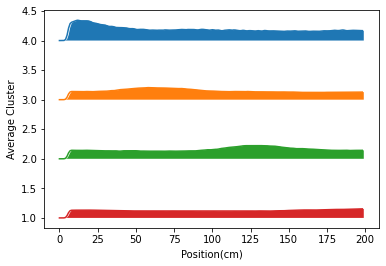

In [93]:
k = find_best_k(np.mean(pl_activity3, axis=0))
classification = classify(k, np.mean(pl_activity3, axis=0))[0]
silhouette_score(np.mean(pl_activity3, axis=0), classification)

In [ ]:
k = find_best_k(np.mean(pl_activity4, axis=0))
classification = classify(k, np.mean(pl_activity4, axis=0))[0]
silhouette_score(np.mean(pl_activity4, axis=0), classification)

In [35]:
def corr_clas(con, pl_activity, k, plot=True):
    corrmatrix = np.corrcoef(pl_activity)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    ax1.imshow(corrmatrix)
#     ax1.set_colorbar()
    ax1.set_xlabel('Place cell no.')
    ax1.set_ylabel('Place cell no.')
    classifications, centers = kmeans(data=pl_activity, k=k)  # classifications: the cluster id of each cell
    centers_peak = np.zeros(k)
    for i in range(k):
        centers_peak[i] = np.argmax(centers[i, 1:-1])
    centers_rank = np.argsort(centers_peak)
    if plot:
        high = 0
        for m in range(k):
            ax2.plot(high+centers[centers_rank[k-1-m], 1:-1])
            ax2.fill_between(x=np.arange(1, 200, 1), y1=high, y2=high+centers[centers_rank[k-1-m], 1:-1])
            high += np.max(centers[centers_rank[k-1-m], 1:-1])
        ax2.set_xlabel('Position(cm)')
        ax2.set_ylabel('Average Cluster')
        plt.show()  
    # plot cell in clusters

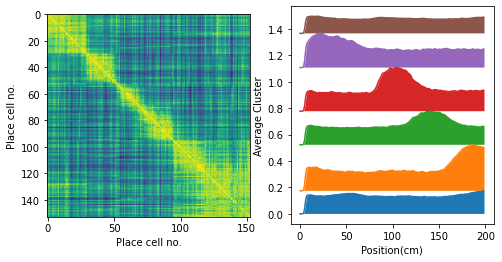

In [37]:
corr_clas(1, np.mean(pl_activity1, axis=0), 6) 

In [ ]:
corr_clas(1, np.mean(pl_activity2, axis=0), 7) 

In [ ]:
corr_clas(1, np.mean(pl_activity3, axis=0), 7) 

In [ ]:
corr_clas(1, np.mean(pl_activity4, axis=0), 7) 

## HSE detection

In [119]:
# smooth and average dffs with 15-bin windows and Savitzky-Golay fliter from dff_traces
s_bins = 15
s_gaussian_kernel = np.exp(-(np.arange(s_bins)-(s_bins-1)/2)**2/2)
s_gaussian_kernel = s_gaussian_kernel / np.sum(s_gaussian_kernel*np.arange(s_bins))
smooth_outputs = np.zeros(dff_traces.shape)
for i in range(s_bins-1):
    smooth_outputs[:, i] = (dff_traces[:, :i+1] @ s_gaussian_kernel[s_bins-i-1:].reshape(1+i, 1)).reshape(cell_num)
for i in range(s_bins-1, dff_traces.shape[1]):
    smooth_outputs[:, i] = (dff_traces[:, i-s_bins+1:i+1] @ s_gaussian_kernel.reshape(s_bins, 1)).reshape(cell_num)
smooth_outputs = smooth_outputs - np.mean(smooth_outputs, axis=0)

In [38]:
# Savitzky–Golay filter
from scipy.signal import savgol_filter as sg_filter

In [51]:
sg_outputs = sg_filter(dff_traces, window_length=15, polyorder=5, axis=0)

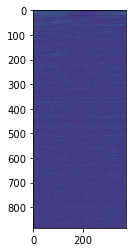

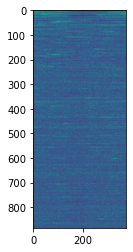

In [55]:
plt.imshow(dff_traces[:, pointer[0]:pointer[1]])
plt.show()
plt.imshow(sg_outputs[:, pointer[0]:pointer[1]])
plt.show()

In [67]:
def get_nonrun_periods(dff, speed):
    nonrun = []
    start = None
    end = None
    for t in range(dff.shape[1]):
        if speed[t] < 2 and (start is None):
            start = t
        elif speed[t] > 2 and (start is not None):
            end = t
            nonrun.append([start, end])
            start = None
    nonrun = np.array(nonrun, dtype=np.int64).reshape(len(nonrun), 2)
    return nonrun

In [68]:
nonrun = get_nonrun_periods(dff_traces[:, pointer[0]:pointer[1]], speed[0])

In [71]:
def detect_HSE(dff, nonrun):  # dff: [cell_num, frames for one trial]  # nonrun: non running periods in this trial
    # detest HSE
    population_dff = np.mean(dff, axis=0)
    mean = population_dff.mean()
    std = np.std(population_dff)
    start = None
    end = None
    HSE_events = []
    for event in nonrun:
        for t in range(event[1]-event[0]):
            if population_dff[t] > mean + 3*std and (start is None):
                start = t + event[0]
            elif population_dff[t] < mean + 1.2*std and (start is not None):
                end = t + event[0]
                HSE_events.append([start, end])
                start = None
    return HSE_events

In [73]:
HSE_events = detect_HSE(sg_outputs[:, pointer[0]:pointer[1]], nonrun)

In [74]:
print(HSE_events)

[]


In [78]:
from sklearn.decomposition import PCA

In [79]:
df = PCA(n_components=2).fit(sg_outputs[:, pointer[0]:pointer[1]])

In [81]:
df.components_.shape

(2, 378)

In [82]:
pointer[1]-pointer[0]

378

In [83]:
def get_reactivated_cell(dff, HSE_events): # dff: [cell_id, frames]  HSE_events: list [[begin, end]]
    reactivated_cell = [[] for i in range(HSE_events.shape[0])]
    for k in range(len(HSE_events)):
        HSE = HSE_events[k]
        pca = PCA(n_components=2).fit(dff[:, HSE[0]-30:HSE[1]+30])  # +- 3s
        pca1 = pca.components_[0]
        for cell_id in range(dff.shape[0]):
            if np.correlate(dff[cell_id, HSE[0]-30:HSE[1]+30], pca1) > 0.5:
                reactivated_cell[k].append(cell_id)
    return reactivated_cell       

SyntaxError: unexpected EOF while parsing (4274172329.py, line 2)

## correlation during HSE
use all HSEs to compute one cross-correlation or one for each?

### reactivated place cell activity in HSE

### compute correlation

In [145]:
def cross_correlation(place_cell, pl_HSEs, pl_peak, shuffle=False, corrs_sign=None):
    if corrs_sign is None:
        corrs = []
    else:
        corrs = np.copy(corrs_sign)
    if shuffle:
        np.random.shuffle(pl_peak)
    for i in range(len(place_cell)):
        for j in range(len(place_cell)):
            if corrs_sign is not None:
                cor = corrs[i*len(place_cell)+j, 0]
            else:
                cor = np.correlate(pl_HSEs[i], pl_HSEs[j])
                dis = int(abs(pl_peak[i] - pl_peak[j]))
                corrs.append([cor, dis])
    corrs = np.array(corrs)
    # average on dis
    dis_bins = np.arange(np.min(corrs[:,1]), np.max(corrs[:,1])+1, 1)
    mindis = int(np.min(corrs[:,1]))
    corrs_aver = np.zeros(len(dis_bins))
    corrs_num = np.zeros(len(dis_bins))
    for corr in corrs:
        corrs_aver[corr[1]-mindis] += corr[0]
        corrs_num[corr[1]-mindis] += 1
    corrs_aver /= corrs_num
    if shuffle:
        return corrs_aver
    return corrs, corrs_aver, dis_bins

C:\Users\lily\anaconda3\envs\hippo_env\lib\site-packages\ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  app.launch_new_instance()


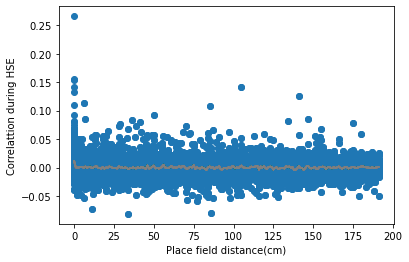

In [149]:
corrs, corrs_aver, dis_bins = cross_correlation(pl_ranked1, pl_HSEs, pl_peak1)
plt.scatter(corrs[:, 1], corrs[:, 0])
plt.plot(dis_bins, corrs_aver)
plt.xlabel('Place field distance(cm)')
plt.ylabel('Correlattion during HSE')
for i in range(1000):
    corrs_aver = cross_correlation(pl_ranked1, pl_HSEs, pl_peak1, shuffle=True, corrs_sign=corrs)
    plt.plot(dis_bins, corrs_aver, color='grey')
plt.show()
# figb

In [ ]:
# figc

In [ ]:
# data
# classifications
# reactivated_cell
cluster_num = np.max(classifications)+1
reactivated_cluster = [[] for i in range(len(HSE_event))]
pca1 = [[] for i in range(len(HSE_event))]
cluster_peak = [[] for i in range(len(HSE_event))]
for i in range(len(HSE_event)):
    event = HSE_event[i]
    for k in range(cluster_num):
        if len(np.intersect1d(reactivated_cell, np.where(classifications==k)[0])) >= 5:
            reactivated_cluster[i].append(k)
            pca = PCA(n_components=2).fit(data[np.where(classifications==k)[0][:], event[0]:event[1]])
            pca1[i].append(pca.components_[0])
            cluster_peak[i].append(np.argmax(pca.components_[0]))

    
            